
## a) Generate a sine wave, add noise to it, and then perform convolution with a smoothing filter to reduce noise. Make your code general, so that it takes the filter from the user.

Enter the filter (average, bw, median): bw


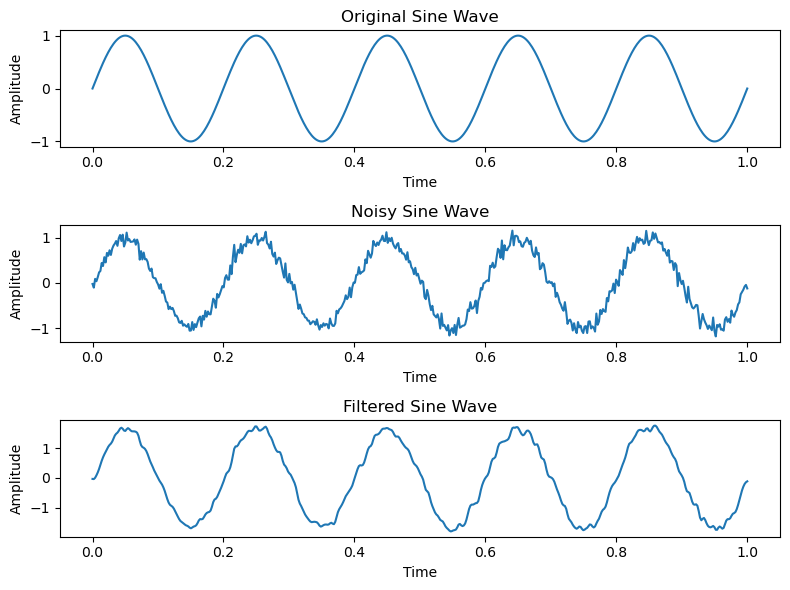

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp

def generate_noisy_signal(N: float = 1, samples: int = 100, F: int = 5, LEVEL: float = 0.1):
    time = np.linspace(start=0, stop=1, num=samples)  # Time Axis
    sine = np.sin(N * np.pi * F * time)  # Sine Wave
    noise = np.random.randn(samples)  # Noise
    noisy_signal = sine + LEVEL * noise  # Noisy Sine Signal
    return noisy_signal, sine, time

def get_average_filter(window_size: int):
    return np.ones(window_size) / window_size

def get_butterworth_filter(order, cut_off):
    return sp.signal.butter(N=order, Wn=cut_off)

def main():
    name = input("Enter the filter (average, bw, median): ")

    if name == "average":
        signal_filter = get_average_filter(window_size=5)
    elif name == "bw":
        a, b = get_butterworth_filter(order=5, cut_off=0.5)
        signal_filter = a / b[0]
    elif name == "median":
        signal_filter = sp.signal.medfilt(volume=sine_signal, kernel_size=5)
    else:
        print("Enter a valid filter!")
        return

    noisy_signal, sine_signal, time = generate_noisy_signal(N=5, samples=500, F=2, LEVEL=0.1)

    # Apply the chosen filter
    filtered_signal = np.convolve(noisy_signal, signal_filter, mode="same")

    # Plotting
    plt.figure(figsize=(8, 6))
    plt.subplot(3, 1, 1)
    plt.plot(time, sine_signal, label='Original Sine Wave')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title('Original Sine Wave')

    plt.subplot(3, 1, 2)
    plt.plot(time, noisy_signal, label='Noisy Signal')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title('Noisy Sine Wave')

    plt.subplot(3, 1, 3)
    plt.plot(time, filtered_signal, label='Filtered Signal')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title('Filtered Sine Wave')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

    

## b) For the given ECG signals  compute and show the location of the R peak.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, butter, filtfilt
from scipy.fft import ifft
import pandas as pd

# Load the ECG signal
ecg_table = pd.read_csv("/home/nalin/Downloads/ecg(1).csv")
ecg = ecg_table['Channel 1 (V)']
time = ecg_table['Time (s)']

# Plot simple ECG signal
plt.figure(figsize=(12, 4))
plt.plot(time, ecg, label='Simple ECG Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Simple ECG Signal')
plt.legend()
plt.grid(True)
plt.show()

# Compute and show the location of the R peak
peaks, _ = find_peaks(ecg, height=0.6 * np.max(ecg))

plt.figure(figsize=(12, 4))
plt.plot(time, ecg, label='ECG Signal')
plt.plot(time[peaks], ecg[peaks], 'x', color='red', label='R Peak')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('ECG Signal with R Peak Location')
plt.legend()
plt.grid(True)
plt.show()


## c) Add noise to the ECG signal, and filter in the frequency domain such that the R peak is largely preserved.

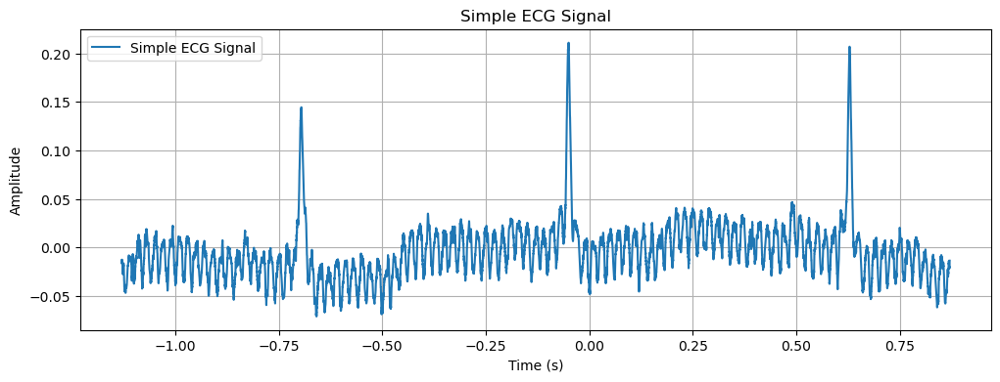

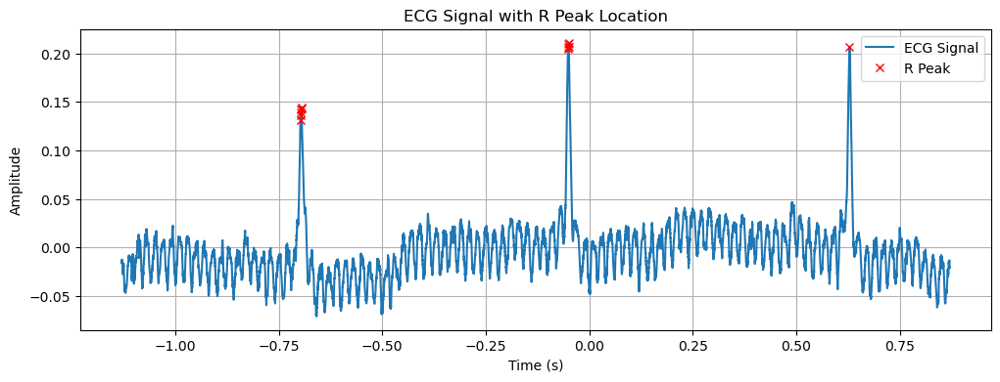

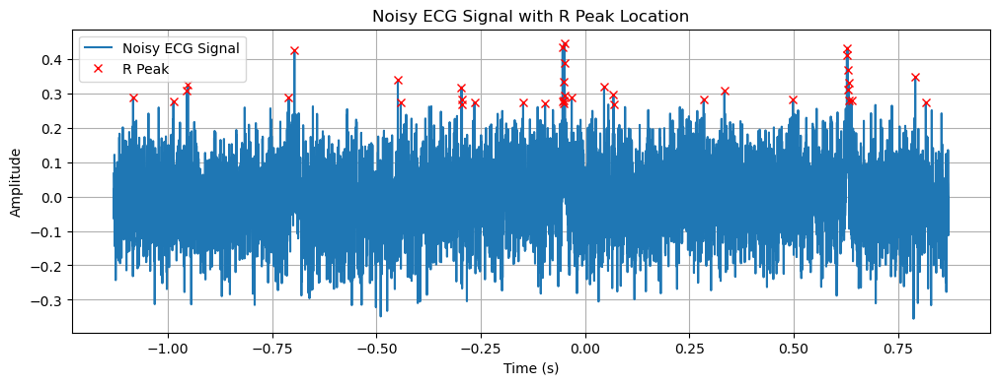

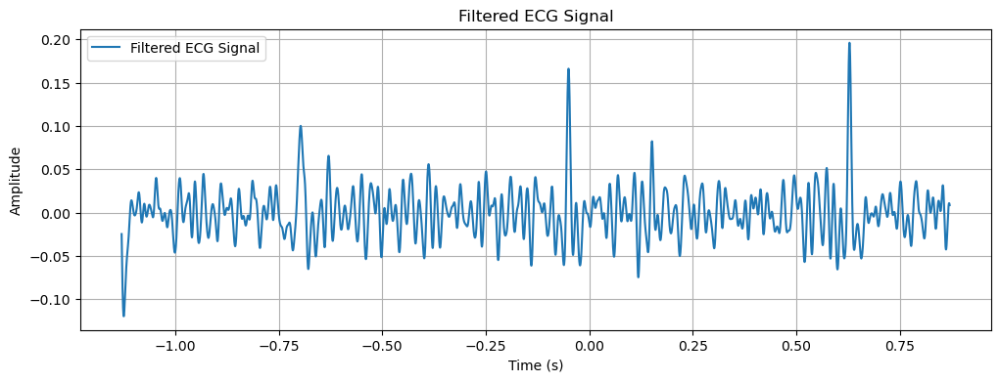

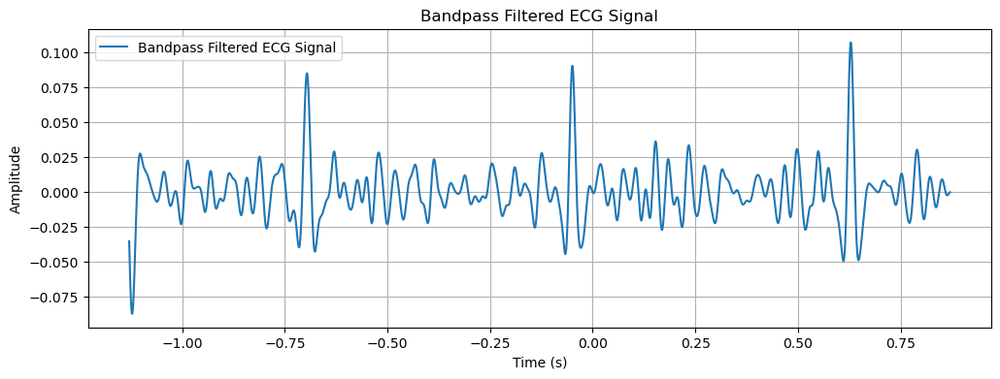

/home/nalin/anaconda3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


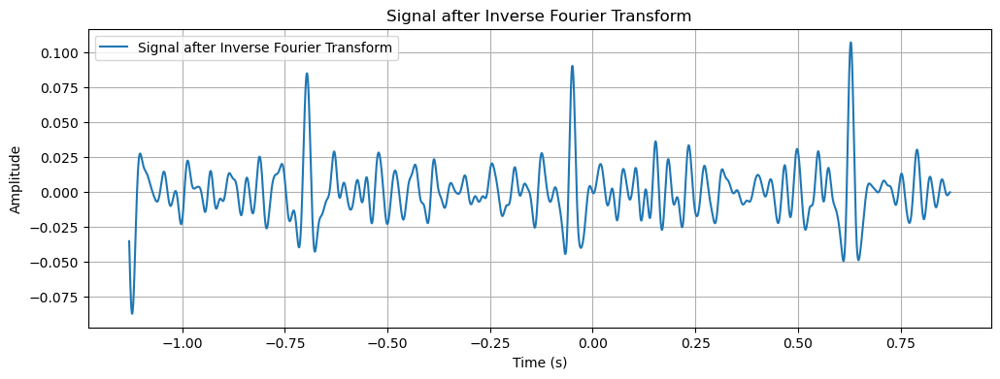

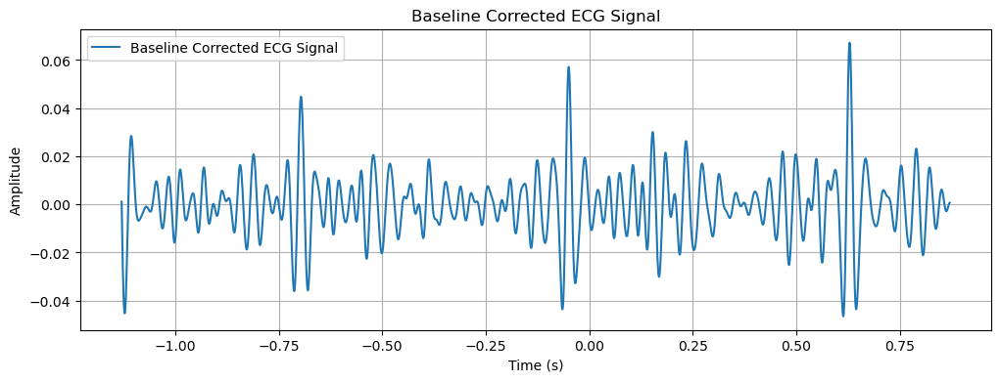

/home/nalin/anaconda3/lib/python3.9/site-packages/scipy/signal/_peak_finding.py:261: ComplexWarning: Casting complex values to real discards the imaginary part
  value = np.asarray(value, order='C', dtype=np.float64)
/home/nalin/anaconda3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


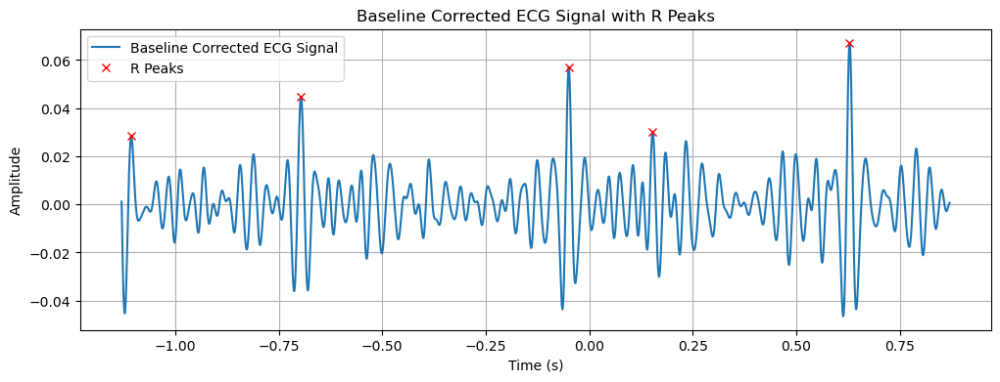

In [28]:

# Add noise to the ECG signal
noise_level = 0.1
noisy_ecg = ecg + np.random.normal(0, noise_level, len(ecg))


# Compute and show the location of the R peak in the noisy ECG signal
peaks, _ = find_peaks(noisy_ecg, height=0.6 * np.max(noisy_ecg))

plt.figure(figsize=(12, 4))
plt.plot(time, noisy_ecg, label='Noisy ECG Signal')
plt.plot(time[peaks], noisy_ecg[peaks], 'x', color='red', label='R Peak')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Noisy ECG Signal with R Peak Location')
plt.legend()
plt.grid(True)
plt.show()


# Butterworth filter
def butterworth_filter(signal, low_cut, high_cut, Fs):
    Bw = [low_cut / (Fs / 2), high_cut / (Fs / 2)]
    b, a = butter(N=3, Wn=Bw, btype='band')
    return filtfilt(b, a, signal)

# Apply the Butterworth filter to the noisy ECG signal
filtered_ecg = butterworth_filter(noisy_ecg, low_cut=10, high_cut=80, Fs=1/(time[1]-time[0]))

# Plot the filtered ECG signal
plt.figure(figsize=(12, 4))
plt.plot(time, filtered_ecg, label='Filtered ECG Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Filtered ECG Signal')
plt.legend()
plt.grid(True)
plt.show()

# Bandpass filtering
def bandpass_filter(signal, low_cut, high_cut, Fs):
    Bw = [low_cut / (Fs / 2), high_cut / (Fs / 2)]
    b, a = butter(N=3, Wn=Bw, btype='band')
    return filtfilt(b, a, signal)

# Apply the bandpass filter to the filtered ECG signal
bandpass_filtered_ecg = bandpass_filter(filtered_ecg, low_cut=10, high_cut=40, Fs=1/(time[1]-time[0]))

# Plot the bandpass filtered ECG signal
plt.figure(figsize=(12, 4))
plt.plot(time, bandpass_filtered_ecg, label='Bandpass Filtered ECG Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Bandpass Filtered ECG Signal')
plt.legend()
plt.grid(True)
plt.show()

# Inverse Fourier Transform
fft_filtered_ecg = fft(bandpass_filtered_ecg)
inverse_fft_filtered_ecg = ifft(fft_filtered_ecg)

# Plot the signal after inverse Fourier Transform
plt.figure(figsize=(12, 4))
plt.plot(time, inverse_fft_filtered_ecg, label='Signal after Inverse Fourier Transform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Signal after Inverse Fourier Transform')
plt.legend()
plt.grid(True)
plt.show()

# Base-line correction
def baseline_correction(signal, window_size):
    b, a = butter(N=5, Wn=0.01, btype='high')
    return filtfilt(b, a, signal)

baseline_corrected_ecg = baseline_correction(inverse_fft_filtered_ecg, window_size=5)

# Plot the baseline corrected ECG signal
plt.figure(figsize=(12, 4))
plt.plot(time, baseline_corrected_ecg, label='Baseline Corrected ECG Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Baseline Corrected ECG Signal')
plt.legend()
plt.grid(True)
plt.show()

# Find R Peaks
THETA = 0.9
peaks_corrected, _ = find_peaks(x=baseline_corrected_ecg, prominence=THETA * np.max(baseline_corrected_ecg))

plt.figure(figsize=(12, 4))
plt.plot(time, baseline_corrected_ecg, label='Baseline Corrected ECG Signal')
plt.plot(time[peaks_corrected], baseline_corrected_ecg[peaks_corrected], 'x', color='red', label='R Peaks')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Baseline Corrected ECG Signal with R Peaks')
plt.legend()
plt.grid(True)
plt.show()


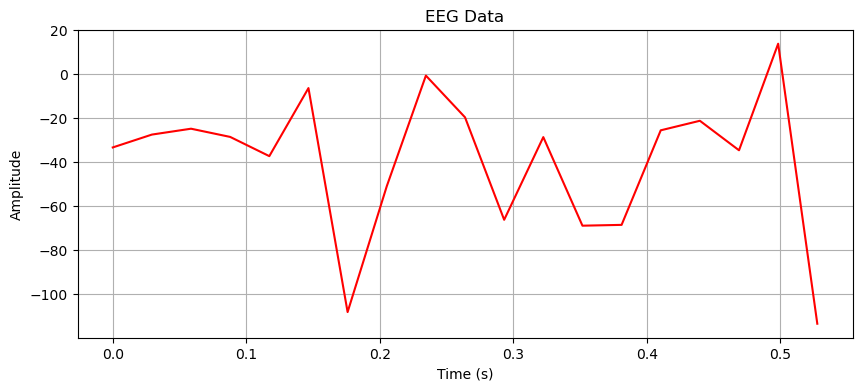

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Load EEG data from the file
file_path = '/home/nalin/Downloads/eeg_data_files-20240411/57_00002656_none_montage_False.npy'
eeg_data = np.load(file_path)

# Transpose the EEG data to read rows instead of columns
eeg_data = eeg_data.T

# Assuming the data is sampled at a constant frequency
# You may need additional information about the sampling rate from the data provider
# For this example, let's assume a sampling rate of 256 Hz
sampling_rate = 36
num_samples = eeg_data.shape[1]  # Note the change here
duration = num_samples / sampling_rate
time = np.linspace(0, duration, num_samples)

# Plot EEG data
plt.figure(figsize=(10, 4))
plt.plot(time, eeg_data[1], "r-")  # Plotting the first row/channel
plt.title('EEG Data')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()


## Given EEG data files, filter the signals to get the output in the frequency ranges as

  ##  Delta

  ## Theta

  ## Alpha

## Beta Plot both the time and frequency domains of the input and output signals in each case. Also plot the filters that you used in the frequency domain.


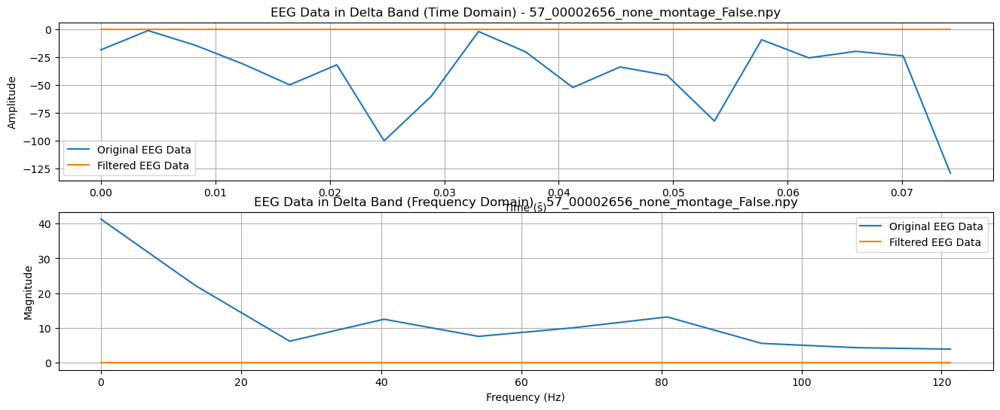

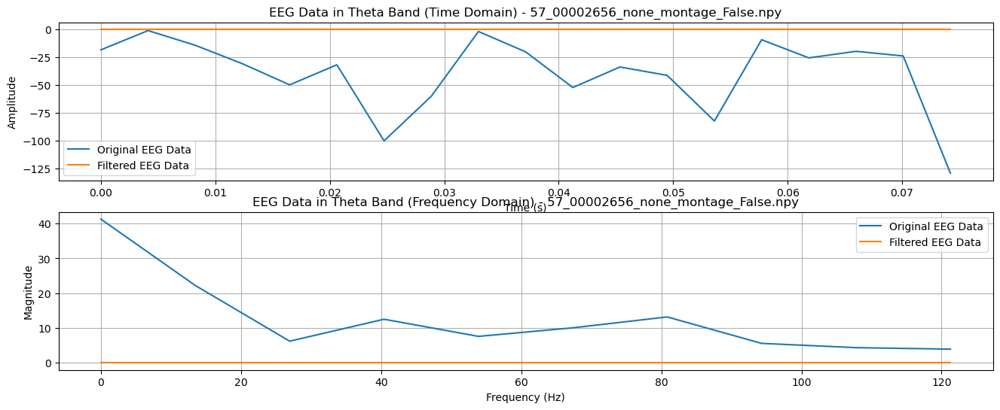

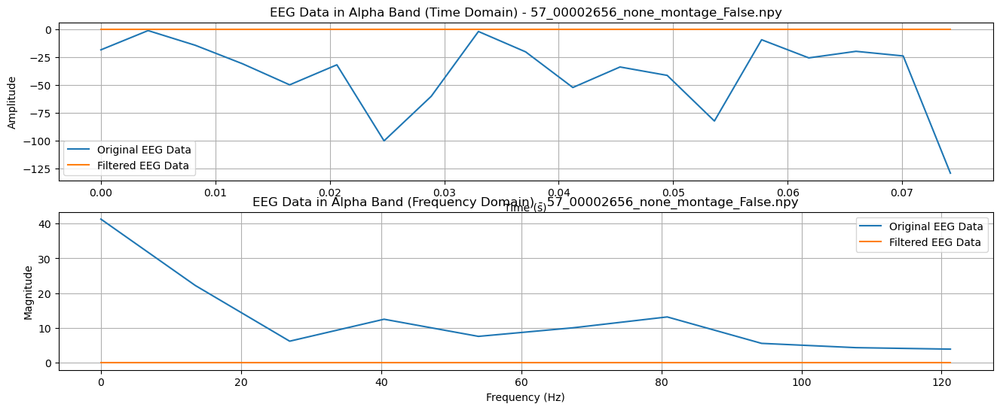

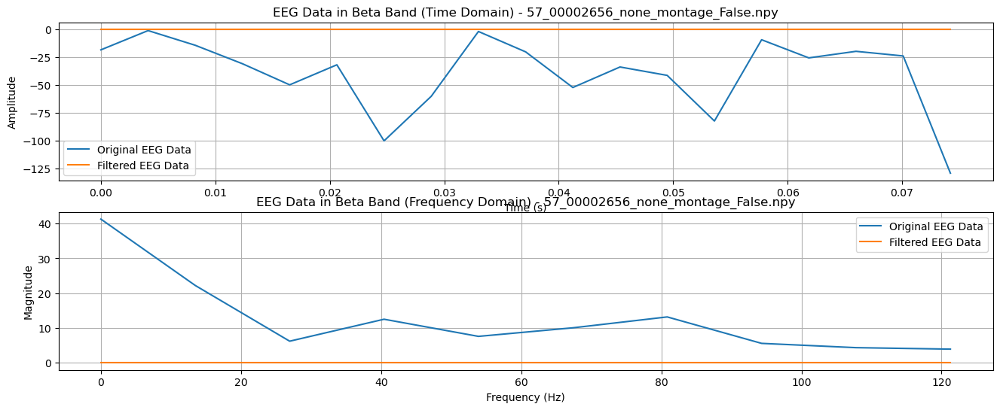

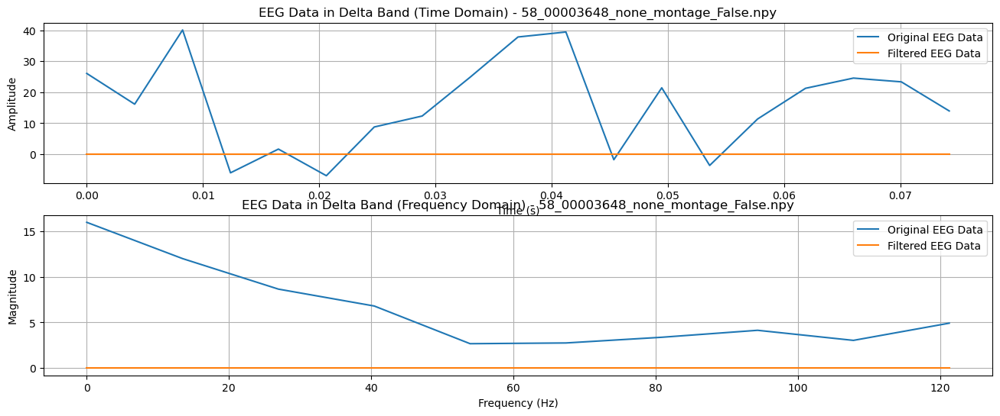

...

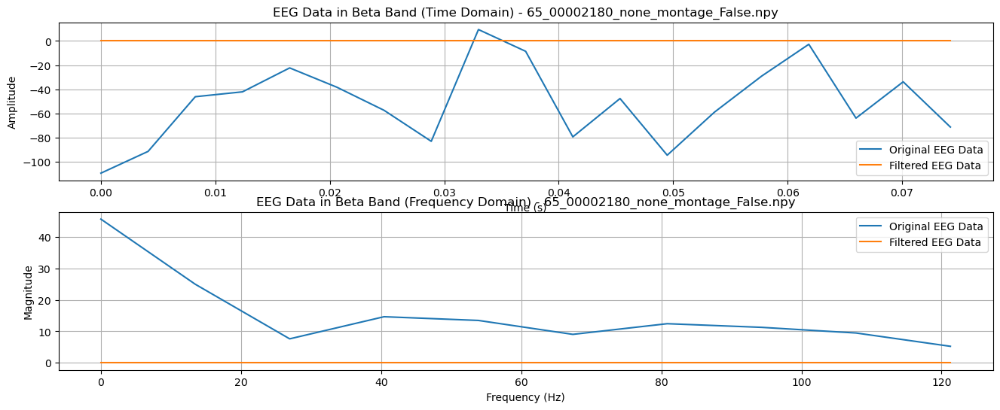

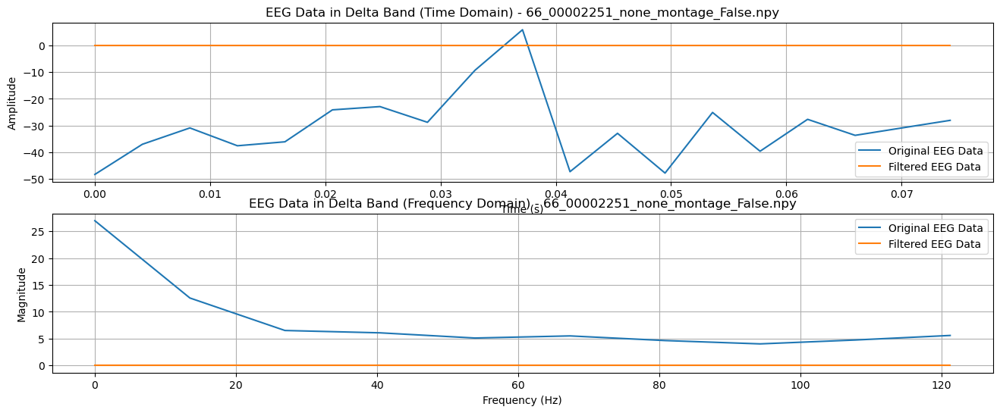

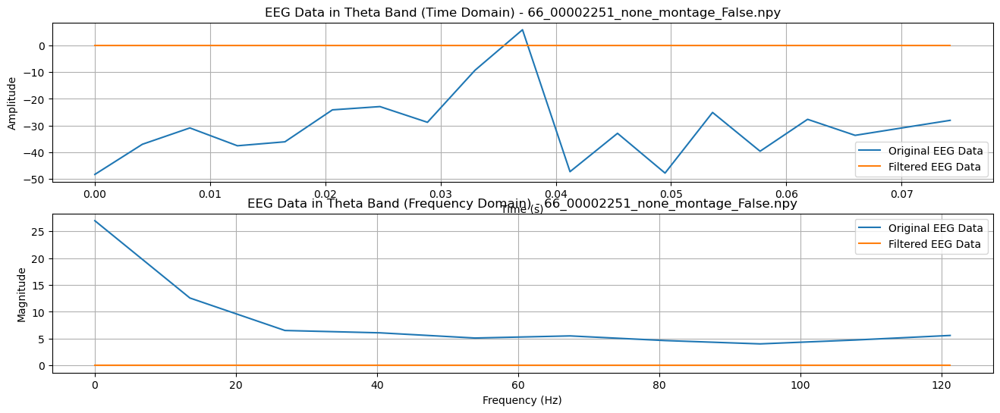

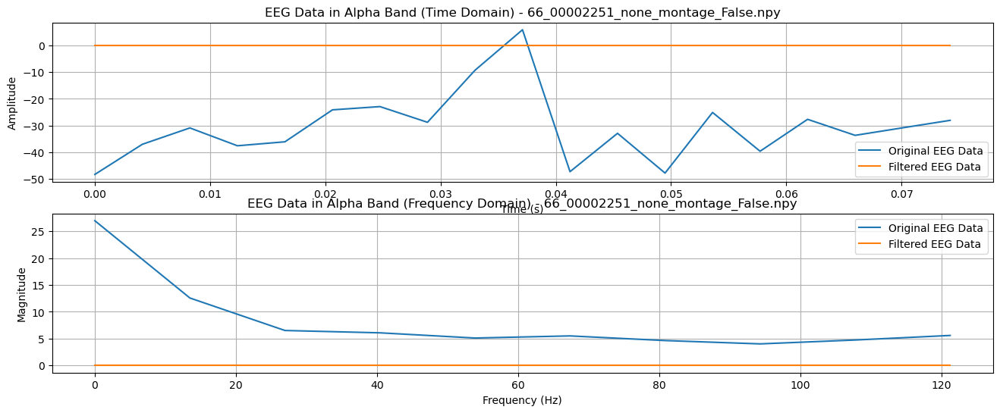

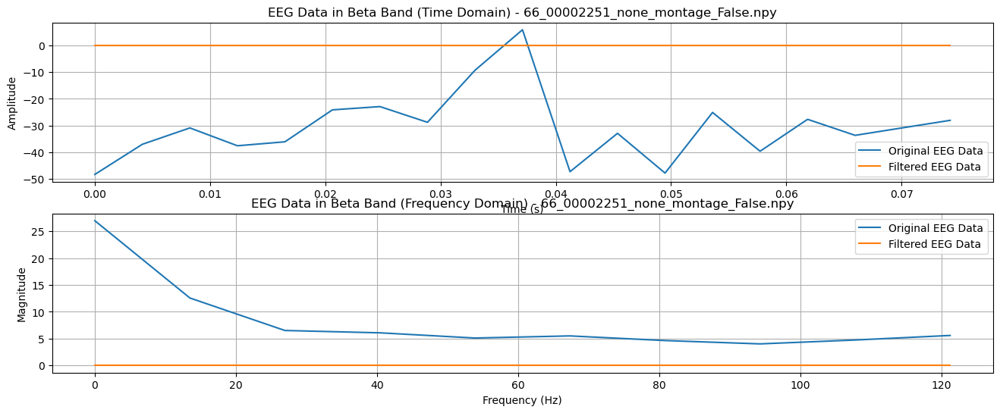

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, freqz
import os

# Function to create Butterworth filter
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

# Function to apply filter to data
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    padlen = max(0, len(data) - 1)  # Adjust padding length dynamically
    y = filtfilt(b, a, data, padlen=padlen)
    return y

# Define frequency bands (in Hz)
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 12),
    'Beta': (12, 30)
}

# Specify the directory containing the EEG data files
data_directory = '/home/nalin/Downloads/eeg_data_files-20240411'

# Iterate through the files in the specified directory
for file_name in sorted(os.listdir(data_directory)):
    if file_name.endswith('.npy'):
        file_path = os.path.join(data_directory, file_name)
        eeg_data = np.load(file_path).T  # Transpose to read rows as channels

        # Assuming the data is sampled at a constant frequency
        # You may need additional information about the sampling rate from the data provider
        # For this example, let's assume a sampling rate of 256 Hz
        fs = 256

        # Filter and plot for each frequency band
        for band, (lowcut, highcut) in bands.items():
            # Normalize cutoff frequencies by Nyquist frequency
            lowcut = lowcut / (fs / 2)
            highcut = highcut / (fs / 2)

            # Filter EEG data
            filtered_data = butter_bandpass_filter(eeg_data[0], lowcut, highcut, fs, order=5)

            # Plot time domain
            plt.figure(figsize=(16, 6))
            plt.subplot(2, 1, 1)
            plt.plot(np.linspace(0, len(eeg_data[0])/fs, len(eeg_data[0])), eeg_data[0], label='Original EEG Data')
            plt.plot(np.linspace(0, len(filtered_data)/fs, len(filtered_data)), filtered_data, label='Filtered EEG Data')
            plt.title('EEG Data in ' + band + ' Band (Time Domain) - ' + file_name)
            plt.xlabel('Time (s)')
            plt.ylabel('Amplitude')
            plt.legend()
            plt.grid(True)

            # Plot frequency domain
            plt.subplot(2, 1, 2)
            plt.magnitude_spectrum(eeg_data[0], Fs=fs, label='Original EEG Data')
            plt.magnitude_spectrum(filtered_data, Fs=fs, label='Filtered EEG Data')
            plt.title('EEG Data in ' + band + ' Band (Frequency Domain) - ' + file_name)
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Magnitude')
            plt.legend()
            plt.grid(True)

        plt.show()

## Single plots

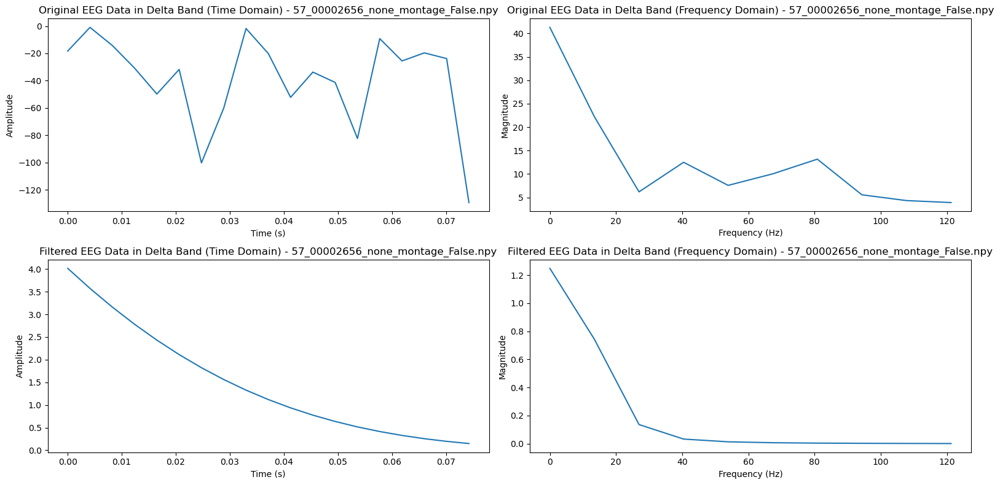

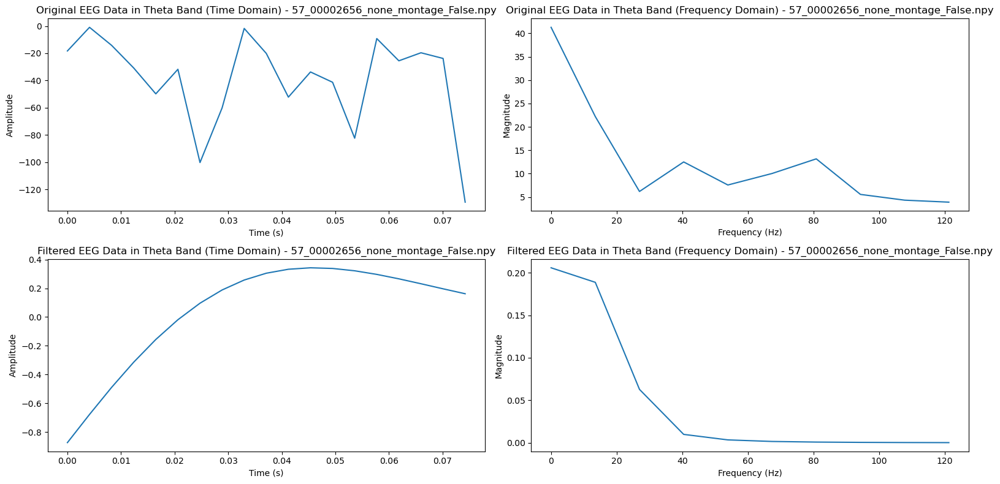

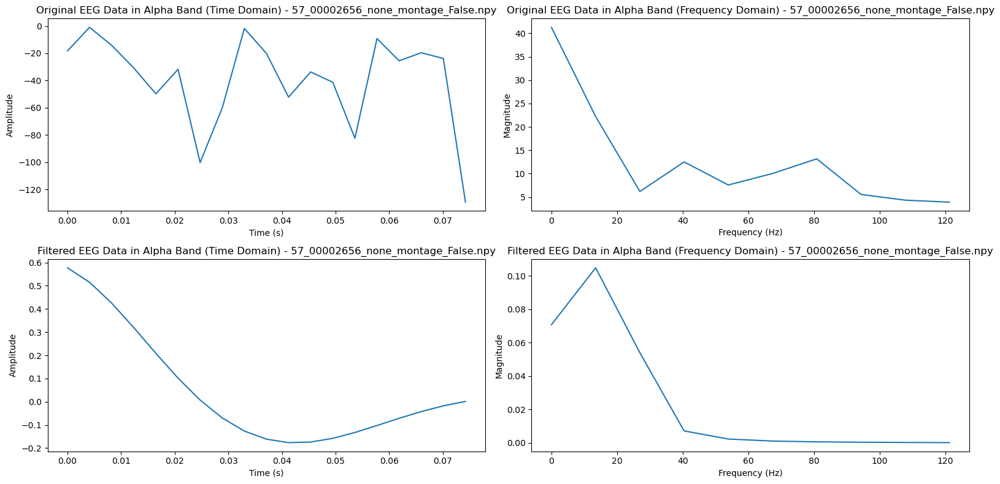

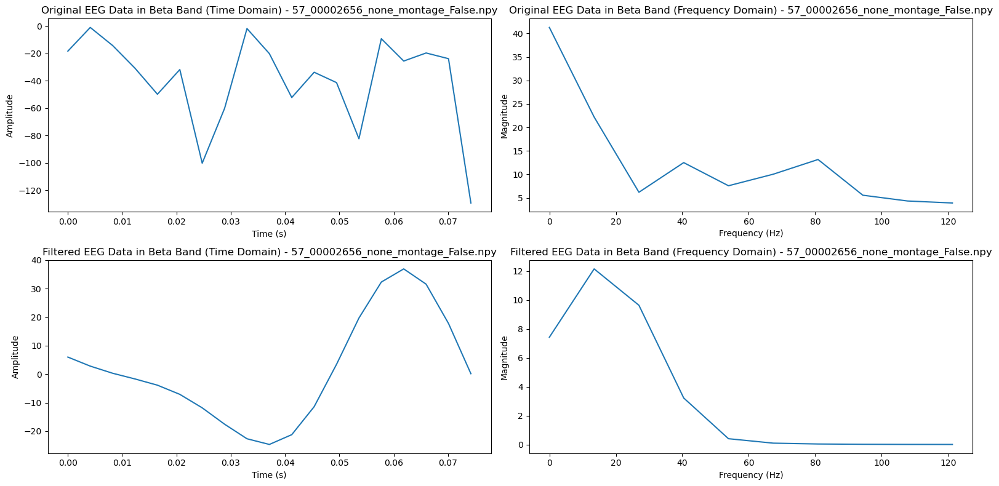

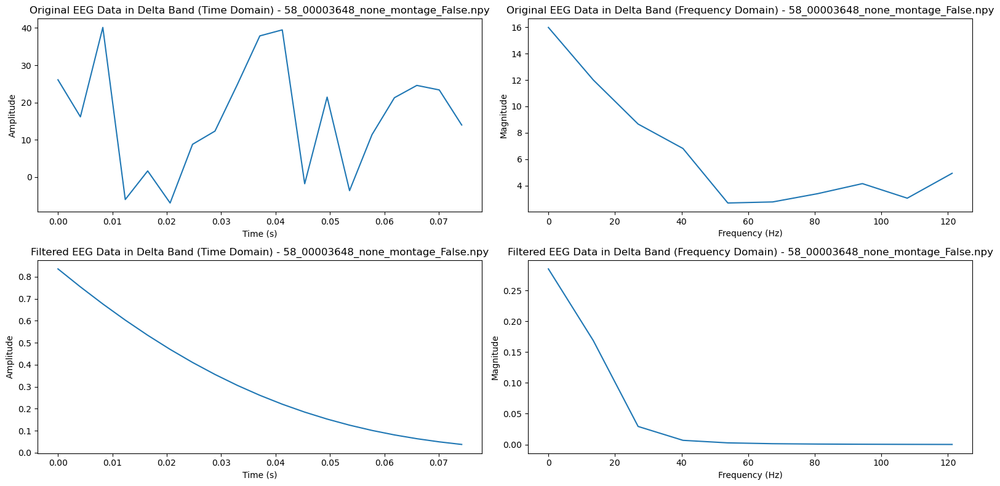

...

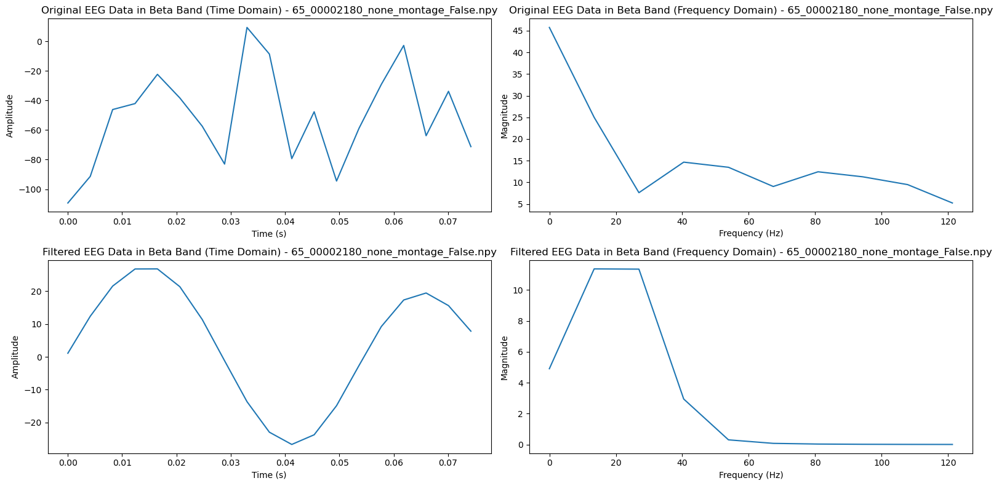

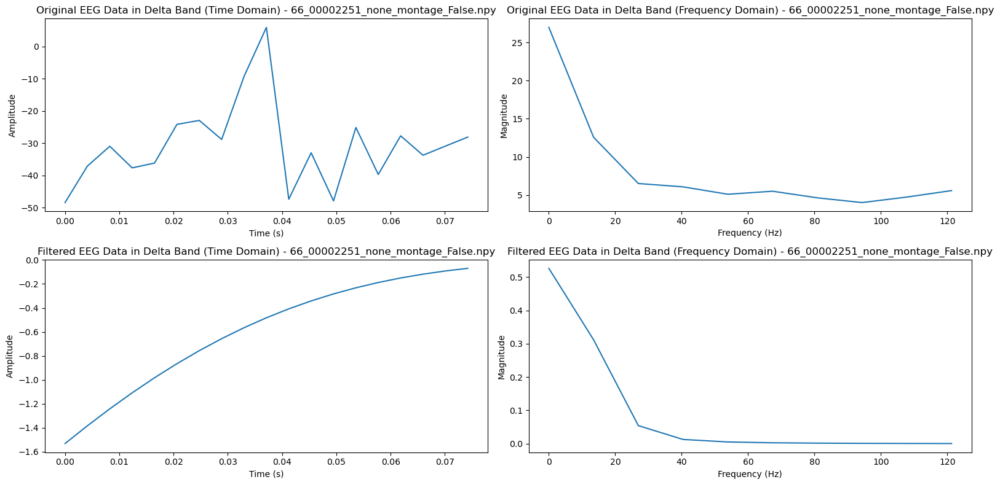

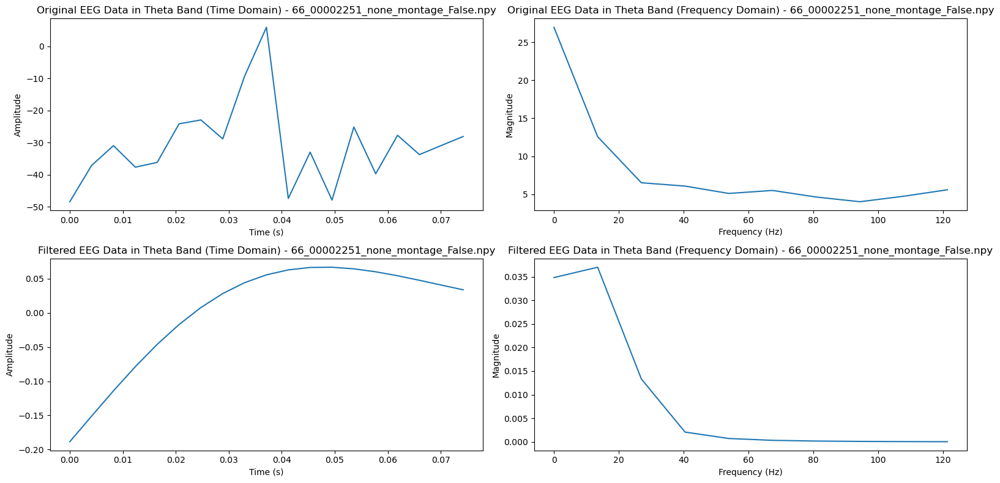

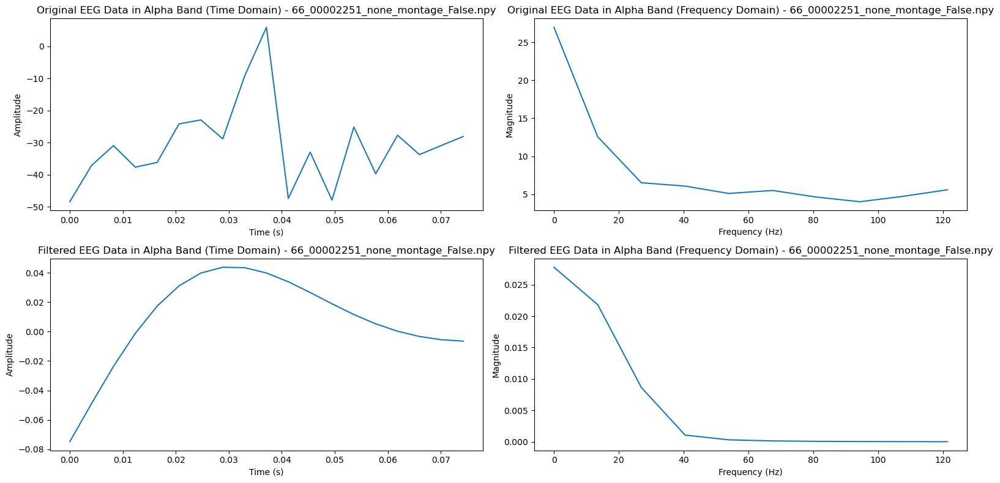

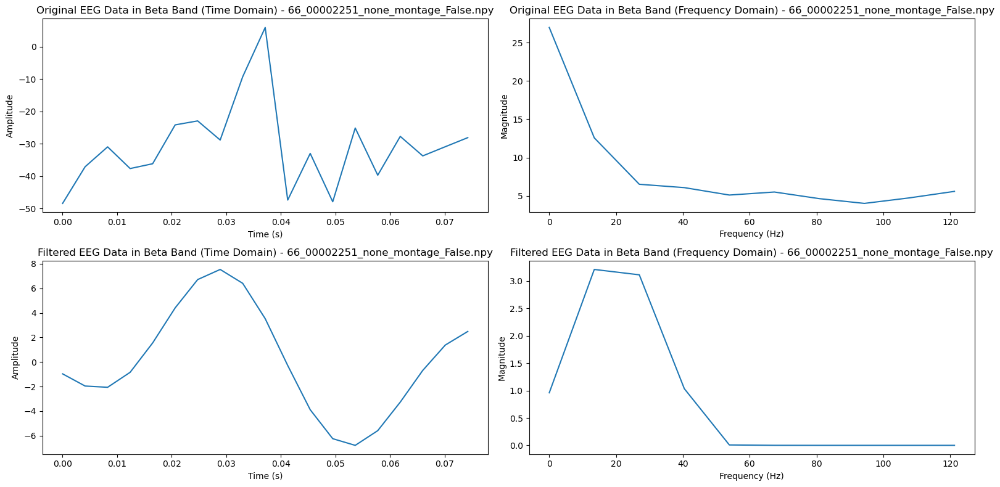

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, freqz
import os

# Function to create Butterworth filter
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

# Function to apply filter to data
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    padlen = max(0, len(data) - 1)  # Adjust padding length dynamically
    y = filtfilt(b, a, data, padlen=padlen)
    return y

# Define frequency bands (in Hz)
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 12),
    'Beta': (12, 30)
}

# Specify the directory containing the EEG data files
data_directory = '/home/nalin/Downloads/eeg_data_files-20240411'

# Iterate through the files in the specified directory
for file_name in sorted(os.listdir(data_directory)):
    if file_name.endswith('.npy'):
        file_path = os.path.join(data_directory, file_name)
        eeg_data = np.load(file_path).T  # Transpose to read rows as channels

        # Assuming the data is sampled at a constant frequency
        # You may need additional information about the sampling rate from the data provider
        # For this example, let's assume a sampling rate of 256 Hz
        fs = 256

        # Filter and plot for each frequency band
        for band, (lowcut, highcut) in bands.items():
            # Normalize cutoff frequencies by Nyquist frequency
            lowcut = lowcut
            highcut = highcut

            # Filter EEG data
            filtered_data = butter_bandpass_filter(eeg_data[0], lowcut, highcut, fs, order=5)

            # Plot time and frequency domains for original and filtered signals
            plt.figure(figsize=(16, 8))
            
            # Plot original signal in time domain
            plt.subplot(2, 2, 1)
            plt.plot(np.linspace(0, len(eeg_data[0])/fs, len(eeg_data[0])), eeg_data[0])
            plt.title('Original EEG Data in ' + band + ' Band (Time Domain) - ' + file_name)
            plt.xlabel('Time (s)')
            plt.ylabel('Amplitude')

            # Plot original signal in frequency domain
            plt.subplot(2, 2, 2)
            plt.magnitude_spectrum(eeg_data[0], Fs=fs)
            plt.title('Original EEG Data in ' + band + ' Band (Frequency Domain) - ' + file_name)
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Magnitude')

            # Plot filtered signal in time domain
            plt.subplot(2, 2, 3)
            plt.plot(np.linspace(0, len(filtered_data)/fs, len(filtered_data)), filtered_data)
            plt.title('Filtered EEG Data in ' + band + ' Band (Time Domain) - ' + file_name)
            plt.xlabel('Time (s)')
            plt.ylabel('Amplitude')

            # Plot filtered signal in frequency domain
            plt.subplot(2, 2, 4)
            plt.magnitude_spectrum(filtered_data, Fs=fs)
            plt.title('Filtered EEG Data in ' + band + ' Band (Frequency Domain) - ' + file_name)
            plt.xlabel('Frequency (Hz)')
            plt.ylabel('Magnitude')

            plt.tight_layout()
            plt.show()
